### Contents
#### Importing libraries
#### Importing data sets
#### Creating subset of df
#### Grouping data with pandas
#### Aggregating data with agg( )
#### Performing single aggregation
#### Aggregating with mean 
#### Aggregating mean function with dot
#### Performing multiple aggregations: mean, min, max
#### Aggregating data with transform( )
#### Changing maximum number of rows shown
#### Deriving columns with loc( )
#### Creating loyalty label
#### Creating head for only relevant columns
#### Finding the aggregated mean of the “order_number” column grouped by “department_id”
#### Determining of prices paid by loyal customers differs from other customers
#### Finding average price of items bought by each user
#### Creating Avg_price_paid column
#### Creating spending flag
#### Finding average days since last order by each user
#### Creating Avg_days_since_order column
#### Creating frequency flag

### Importing libraries

In [1]:
#import libraries
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)
import numpy as np
import os

In [2]:
#defining path
path = r'/Users/davidmsimpson/20230907 Instacart Basket Analysis'

In [3]:
# Import df_ords_prods_merged
df_ords_prods_merged2 = pd.read_csv(os.path.join(path, '02 Data', 'Prepared Data', 'ords_prods_merged.csv'), index_col = 0)

In [4]:
df_ords_prods_merged2.head()

,order_id,user_id,order_number,order_day_of_week,order_hour_of_day,days_since_prior_order,new_customer,product_id,add_to_cart_order,reordered,_merge,Unnamed: 0_y,product_name,aisle_id,department_id,prices,price_range_loc,busiest days,busiest period,busiest_period_of_day
0,2539329,1,1,2,8,NaN,1,196,1,0,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Busiest period,Most orders
1,2398795,1,2,3,7,15.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders
2,473747,1,3,3,12,21.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders
3,2254736,1,4,4,7,29.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders
4,431534,1,5,4,15,28.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders


In [5]:
df_ords_prods_merged2.shape

(23045571, 20)

In [6]:
# Creating subset of df
df = df_ords_prods_merged2[:1000000]

In [7]:
df.shape

(1000000, 20)

### Grouping data with pandas

In [8]:
df.groupby('product_name')

### Aggregating data with agg()

In [9]:
# Performing a single aggregation
df.groupby('department_id').agg({'order_number': ['mean']})

,order_number
,mean
department_id,
4,18.825780
7,17.472355
13,17.993423
14,19.246334
16,19.463012
17,11.294069
19,19.305237
20,17.599636


In [10]:
# Aggregating with mean function
df.groupby('department_id')['order_number'].mean()

department_id
4     18.825780
7     17.472355
13    17.993423
14    19.246334
16    19.463012
17    11.294069
19    19.305237
20    17.599636
Name: order_number, dtype: float64

In [11]:
# Aggregating mean function with dot
df.groupby('department_id').order_number.mean()

department_id
4     18.825780
7     17.472355
13    17.993423
14    19.246334
16    19.463012
17    11.294069
19    19.305237
20    17.599636
Name: order_number, dtype: float64

In [12]:
# Performing multiple aggregations: mean, min, max
df.groupby('department_id').agg({'order_number': ['mean', 'min', 'max']})

order_number        
                      mean min max
department_id                     
4                18.825780   1  99
7                17.472355   1  99
13               17.993423   1  99
14               19.246334   1  99
16               19.463012   1  99
17               11.294069   1  98
19               19.305237   1  99
20               17.599636   1  99

### Aggregating data with transform( )

In [13]:
df_ords_prods_merged2['max_order'] = df_ords_prods_merged2.groupby(['user_id'])['order_number'].transform(np.max)

In [16]:
# Changing maximum number of rows shown
pd.options.display.max_rows = None

In [17]:
# Head of 100 rows
df_ords_prods_merged2.head(100)

,order_id,user_id,order_number,order_day_of_week,order_hour_of_day,days_since_prior_order,new_customer,product_id,add_to_cart_order,reordered,_merge,Unnamed: 0_y,product_name,aisle_id,department_id,prices,price_range_loc,busiest days,busiest period,busiest_period_of_day,max_order
0,2539329,1,1,2,8,NaN,1,196,1,0,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Busiest period,Most orders,10
1,2398795,1,2,3,7,15.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10
2,473747,1,3,3,12,21.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10
3,2254736,1,4,4,7,29.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10
4,431534,1,5,4,15,28.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10
5,3367565,1,6,2,7,19.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Least busy period,Fewest orders,10
6,550135,1,7,1,9,20.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10
7,3108588,1,8,1,14,14.0,0,196,2,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10
8,2295261,1,9,1,16,0.0,0,196,4,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Regularly busy period,Average orders,10
9,2550362,1,10,4,8,30.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10


### Deriving columns with loc( )

In [18]:
# Creating loyalty label
df_ords_prods_merged2.loc[df_ords_prods_merged2['max_order'] > 40, 'loyalty_flag'] = 'Loyal customer'

In [19]:
df_ords_prods_merged2.loc[(df_ords_prods_merged2['max_order'] <= 40) & (df_ords_prods_merged2['max_order'] > 10), 'loyalty_flag'] = 'Regular customer'

In [20]:
df_ords_prods_merged2.loc[df_ords_prods_merged2['max_order'] <= 10, 'loyalty_flag'] = 'New customer'

In [21]:
df_ords_prods_merged2['loyalty_flag'].value_counts(dropna=False)

loyalty_flag
Regular customer    11206971
Loyal customer       7555150
New customer         4283450
Name: count, dtype: int64

In [22]:
# Creating head for only relevant columns
df_ords_prods_merged2[['user_id', 'loyalty_flag', 'order_number']].head(60)

,user_id,loyalty_flag,order_number
0,1,New customer,1
1,1,New customer,2
2,1,New customer,3
3,1,New customer,4
4,1,New customer,5
5,1,New customer,6
6,1,New customer,7
7,1,New customer,8
8,1,New customer,9
9,1,New customer,10


## Task 4.8

#### 2:

In [23]:
# 2: find the aggregated mean of the “order_number” column grouped by “department_id” for 
df_ords_prods_merged2.groupby('product_name')

In [24]:
df_ords_prods_merged2.groupby('department_id')['order_number'].mean()

department_id
1     15.936679
2     18.236566
3     17.415821
4     17.942323
5     15.553993
6     16.527931
7     17.305034
8     16.256962
9     16.120520
10    20.803259
11    16.059137
12    16.250926
13    16.817385
14    16.929143
15    16.564728
16    17.982709
17    16.145227
18    20.003063
19    17.331657
20    16.497969
21    23.511714
Name: order_number, dtype: float64

#### 3: The most important difference between the statistics for the entire dataframe rather than the subset is that the entire df stats have all of the departments included. The statistics for the mean are similar in most cases, although there are a few (like department 17), for which the mean is signficantly different (about 5). The entire df, of course, provides a much more accurate view of the data.

In [25]:
df_ords_prods_merged2.head(10)

,order_id,user_id,order_number,order_day_of_week,order_hour_of_day,days_since_prior_order,new_customer,product_id,add_to_cart_order,reordered,_merge,Unnamed: 0_y,product_name,aisle_id,department_id,prices,price_range_loc,busiest days,busiest period,busiest_period_of_day,max_order,loyalty_flag
0,2539329,1,1,2,8,NaN,1,196,1,0,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Busiest period,Most orders,10,New customer
1,2398795,1,2,3,7,15.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10,New customer
2,473747,1,3,3,12,21.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer
3,2254736,1,4,4,7,29.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10,New customer
4,431534,1,5,4,15,28.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer
5,3367565,1,6,2,7,19.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Least busy period,Fewest orders,10,New customer
6,550135,1,7,1,9,20.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10,New customer
7,3108588,1,8,1,14,14.0,0,196,2,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10,New customer
8,2295261,1,9,1,16,0.0,0,196,4,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Regularly busy period,Average orders,10,New customer
9,2550362,1,10,4,8,30.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer


#### 5:

In [26]:
# 5. Determining of prices paid by loyal customers differs from other customers.
df_ords_prods_merged2.groupby('loyalty_flag').prices.mean()

loyalty_flag
Loyal customer      7.875194
New customer        7.874083
Regular customer    7.884672
Name: prices, dtype: float64

#### Loyal customers actually spend less per item on average than new or regular customers, although only slightly. Perhaps this is because loyal customers will buy staple items regularly and less-frequent customers will buy more expensive specialty items, at least to start.

#### 6:

In [27]:
# 6. Finding average price of items bought by each user.
df_ords_prods_merged2.groupby('user_id')['prices'].mean()

user_id
1          6.367797
2          7.515897
3          8.197727
4          8.205556
5          9.189189
6          8.471429
7          7.466990
8          8.781633
9          7.607895
10         8.651049
11         8.328723
12         8.116216
13         8.708642
14         8.014286
15         3.980556
16         8.228571
17         7.337671
18         7.702564
19         8.372059
20         5.409091
21         7.012683
22         7.427536
23         8.222500
24         6.742105
25         8.257143
26         6.783929
27         7.659269
28         8.397268
29         7.437333
30         9.436364
31         8.137793
32         7.571930
33         6.622642
34         7.046875
35         7.906522
36         7.285621
37         8.036170
38         8.480513
39         7.141844
40         6.668269
41         8.061538
42         7.466165
43         7.444898
44         8.194595
45         5.022222
46         8.345223
47         8.676923
48         8.066372
49         7.408511
50         7

In [28]:
# Creating Avg_price_paid column
df_ords_prods_merged2['Avg_price_paid'] = df_ords_prods_merged2.groupby(['user_id'])['prices'].transform(np.mean)

In [29]:
# Creating spending flag
df_ords_prods_merged2.loc[df_ords_prods_merged2['Avg_price_paid'] < 10, 'Spending_flag'] = 'Low spender'

In [30]:
df_ords_prods_merged2.loc[df_ords_prods_merged2['Avg_price_paid'] >= 10, 'Spending_flag'] = 'High spender'

In [31]:
# Checking new columns
df_ords_prods_merged2.head(50)

,order_id,user_id,order_number,order_day_of_week,order_hour_of_day,days_since_prior_order,new_customer,product_id,add_to_cart_order,reordered,_merge,Unnamed: 0_y,product_name,aisle_id,department_id,prices,price_range_loc,busiest days,busiest period,busiest_period_of_day,max_order,loyalty_flag,Avg_price_paid,Spending_flag
0,2539329,1,1,2,8,NaN,1,196,1,0,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Busiest period,Most orders,10,New customer,6.367797,Low spender
1,2398795,1,2,3,7,15.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10,New customer,6.367797,Low spender
2,473747,1,3,3,12,21.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer,6.367797,Low spender
3,2254736,1,4,4,7,29.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10,New customer,6.367797,Low spender
4,431534,1,5,4,15,28.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer,6.367797,Low spender
5,3367565,1,6,2,7,19.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Least busy period,Fewest orders,10,New customer,6.367797,Low spender
6,550135,1,7,1,9,20.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10,New customer,6.367797,Low spender
7,3108588,1,8,1,14,14.0,0,196,2,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10,New customer,6.367797,Low spender
8,2295261,1,9,1,16,0.0,0,196,4,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Regularly busy period,Average orders,10,New customer,6.367797,Low spender
9,2550362,1,10,4,8,30.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer,6.367797,Low spender


In [32]:
# This is number of orders by high spenders and low spenders, not the number of users
df_ords_prods_merged2['Spending_flag'].value_counts(dropna = False)

Spending_flag
Low spender     22841926
High spender      203645
Name: count, dtype: int64

#### 7:

In [33]:
# 7. Finding average days since last order by each user.
df_ords_prods_merged2.groupby('user_id')['days_since_prior_order'].mean()

user_id
1         20.259259
2         15.967033
3         11.487179
4         15.357143
5         14.500000
6          7.800000
7         13.546392
8         30.000000
9         24.260870
10        20.746377
11        19.320988
12        26.169014
13         7.381579
14        24.570732
15        11.029412
16        21.309091
17         8.294118
18         6.466667
19         8.040698
20         5.500000
21        10.055000
22        11.952381
23        16.200000
24        15.162162
25        30.000000
26        11.230769
27         5.129412
28        12.296089
29        11.793427
30        22.625000
31         6.073427
32        22.313131
33        28.700000
34        18.612903
35        20.435294
36        10.612676
37        12.687500
38        22.878453
39        13.459677
40        13.000000
41        26.314815
42        12.945312
43        10.549296
44        30.000000
45        22.941176
46        18.102740
47         9.750000
48        21.369369
49        28.522727
50         5

In [34]:
# Creating Avg_days_since_order column
df_ords_prods_merged2['Avg_days_since_order'] = df_ords_prods_merged2.groupby(['user_id'])['days_since_prior_order'].transform(np.mean)

In [35]:
# Creating frequency flag
df_ords_prods_merged2.loc[df_ords_prods_merged2['Avg_days_since_order'] > 20, 'Frequency_flag'] = 'Non-frequent customer'

In [36]:
df_ords_prods_merged2.loc[(df_ords_prods_merged2['Avg_days_since_order'] > 10) & (df_ords_prods_merged2['Avg_days_since_order'] <= 20), 'Frequency_flag'] = 'Regular customer'

In [38]:
df_filtered = df_ords_prods_merged2[(df_ords_prods_merged2['max_order'] <= 40) & (df_ords_prods_merged2['max_order'] > 10) & (df_ords_prods_merged2['loyalty_flag'] == 'Regular customer')]

In [39]:
df_ords_prods_merged2.loc[(df_ords_prods_merged2['Avg_days_since_order'] <= 10) & (df_ords_prods_merged2['Avg_days_since_order'] <= 20), 'Frequency_flag'] = 'Frequent customer'

In [40]:
# Checking new columns
df_ords_prods_merged2.head(50)

,order_id,user_id,order_number,order_day_of_week,order_hour_of_day,days_since_prior_order,new_customer,product_id,add_to_cart_order,reordered,_merge,Unnamed: 0_y,product_name,aisle_id,department_id,prices,price_range_loc,busiest days,busiest period,busiest_period_of_day,max_order,loyalty_flag,Avg_price_paid,Spending_flag,Avg_days_since_order,Frequency_flag
0,2539329,1,1,2,8,NaN,1,196,1,0,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Busiest period,Most orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
1,2398795,1,2,3,7,15.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
2,473747,1,3,3,12,21.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
3,2254736,1,4,4,7,29.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Least busy period,Fewest orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
4,431534,1,5,4,15,28.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
5,3367565,1,6,2,7,19.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Regularly busy,Least busy period,Fewest orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
6,550135,1,7,1,9,20.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
7,3108588,1,8,1,14,14.0,0,196,2,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Busiest period,Most orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
8,2295261,1,9,1,16,0.0,0,196,4,1,both,195,Soda,77,7,9.0,Mid-range product,Busiest days,Regularly busy period,Average orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer
9,2550362,1,10,4,8,30.0,0,196,1,1,both,195,Soda,77,7,9.0,Mid-range product,Least busy days,Busiest period,Most orders,10,New customer,6.367797,Low spender,20.259259,Non-frequent customer


#### Checking counts for prices for final report

In [42]:
# Checking prices column
price_counts = df_ords_prods_merged2['prices'].value_counts(dropna=False).sort_index()
for price in price_counts.index:
    count = price_counts[price]
    print(f'Price: {price}, Count: {count}')

Price: 1.0, Count: 90851
Price: 1.1, Count: 185052
Price: 1.2, Count: 189581
Price: 1.3, Count: 376161
Price: 1.4, Count: 310662
Price: 1.5, Count: 104518
Price: 1.6, Count: 211128
Price: 1.7, Count: 140899
Price: 1.8, Count: 235628
Price: 1.9, Count: 73180
Price: 2.0, Count: 196380
Price: 2.1, Count: 121376
Price: 2.2, Count: 88169
Price: 2.3, Count: 156784
Price: 2.4, Count: 108095
Price: 2.5, Count: 154678
Price: 2.6, Count: 129057
Price: 2.7, Count: 119486
Price: 2.8, Count: 67753
Price: 2.9, Count: 169543
Price: 3.0, Count: 128065
Price: 3.1, Count: 187142
Price: 3.2, Count: 179196
Price: 3.3, Count: 154892
Price: 3.4, Count: 125791
Price: 3.5, Count: 133453
Price: 3.6, Count: 222462
Price: 3.7, Count: 129344
Price: 3.8, Count: 234476
Price: 3.9, Count: 139636
Price: 4.0, Count: 379934
Price: 4.1, Count: 188223
Price: 4.2, Count: 160511
Price: 4.3, Count: 96072
Price: 4.4, Count: 259700
Price: 4.5, Count: 280356
Price: 4.6, Count: 90597
Price: 4.7, Count: 150947
Price: 4.8, Count:

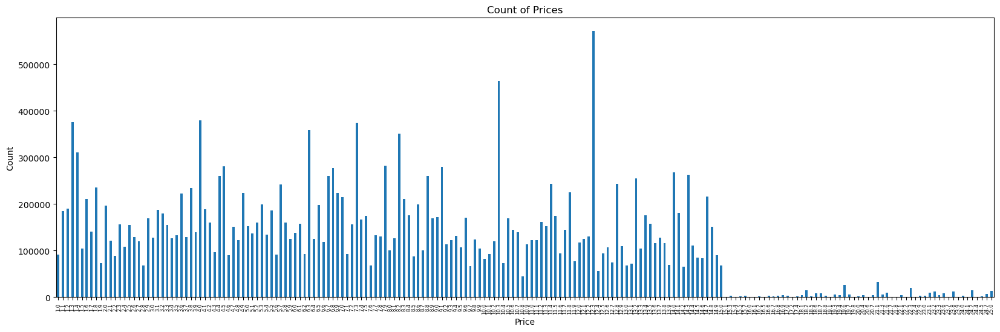

In [64]:
import matplotlib.pyplot as plt
import os

# Value counts for prices and sort them in index order (ascending)
price_counts = df_ords_prods_merged2['prices'].value_counts().sort_index()

# Create a bar chart with customized size and x-axis labels font size
plt.figure(figsize=(20, 6))  # Adjust the size as needed
price_counts.plot(kind='bar')

plt.title('Count of Prices')
plt.xlabel('Price')
plt.ylabel('Count')

# Customize the x-axis tick labels
plt.xticks(rotation=90)  # Rotate the labels for better readability
plt.xticks(fontsize=6)  # Adjust the font size of x-axis labels

# Define the file path where you want to save the chart
save_path = os.path.join(path, '04 Analysis', 'Visualizations', 'bar_count_of_prices.png')

# Save the chart to the specified path
plt.savefig(save_path)

plt.show()

In [60]:
# Saving bar chart
# Define the file path where you want to save the chart
save_path = os.path.join(path, '04 Analysis', 'Visualizations', 'bar_count_of_prices.png')

In [63]:
# Save the chart to the specified path
plt.savefig(save_path)

<Figure size 640x480 with 0 Axes>

#### Calculating price range percentages for final report

In [65]:
# Calculate the value counts for "price_range_loc"
pricerange_counts = df_ords_prods_merged2['price_range_loc'].value_counts(dropna=False)

In [66]:
pricerange_counts

price_range_loc
Mid-range product     15778900
Low-range product      6969483
High-range product      297188
Name: count, dtype: int64

In [67]:
# Calculate the total count of occurrences
total_count = pricerange_counts.sum()

In [68]:
# Calculate the percentage of total occurrences for each range
pricerange_percentages = (pricerange_counts / total_count) * 100

In [69]:
# Create a DataFrame with numerical indices and percentages
pricerange_df = pd.DataFrame({'price_range_loc': pricerange_percentages.index, 'Percentage of Total': pricerange_percentages.values})

In [70]:
# Sort the DataFrame by the pricerange
pricerange_df = pricerange_df.sort_values(by='price_range_loc')

In [71]:
# Reset the index to create index order
pricerange_df = pricerange_df.reset_index(drop=True)

In [72]:
# Display the resulting DataFrame
print(pricerange_df)

      price_range_loc  Percentage of Total
0  High-range product             1.289567
1   Low-range product            30.242180
2   Mid-range product            68.468254


In [ ]:
# Export data to csv
df_ords_prods_merged2.to_csv(os.path.join(path, '02 Data','Prepared Data', 'ords_prods_merged2.csv'))